In [1]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')

# Task 12: Does the galaxy have a mostly clumpy appearance?
Previous task: 

Task 01: Is the galaxy smooth or featured? (need to answer features)

To select clumpy galaxies, need to set cut on $p_{\rm features}$


In [2]:
#Clumpy question. Previous task: smooth_or_features. 

#First define the task in question:
p_clumpy_yes = 't12_clumpy_a01_yes_weighted_fraction' # vote fraction for task
N_clumpy = 't12_clumpy_total_weight' # number of votes for task
#and the previous task:
p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' # vote fraction for previous task
N_smooth_or_features = 't01_smooth_or_features_total_weight' # number of votes for previous task


#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_clumpy]>=N_cut) 

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,11)


fraction_list=[]
err_list=[]
std_list=[]
for p in p_prev_task_list:
    task_data = (data[p_features]>p-.05) & (data[p_features]<p+.05) & min_N

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    if N_in_bin>0:
        fraction_list.append(np.nanmean(data[task_data][p_clumpy_yes]))
    else:
        fraction_list.append(np.nan)
    try:
        err_list.append(np.nanstd(data[task_data][p_clumpy_yes])/np.sqrt(N_in_bin))
        std_list.append(np.nanstd(data[task_data][p_clumpy_yes]))

    except TypeError:
        err_list.append(0)
        std_list.append(0)
        
y1 = [f+e for f,e in zip(fraction_list,err_list)]
y2 = [f-e for f,e in zip(fraction_list,err_list)]


/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:1136: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


(0, 1)

/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


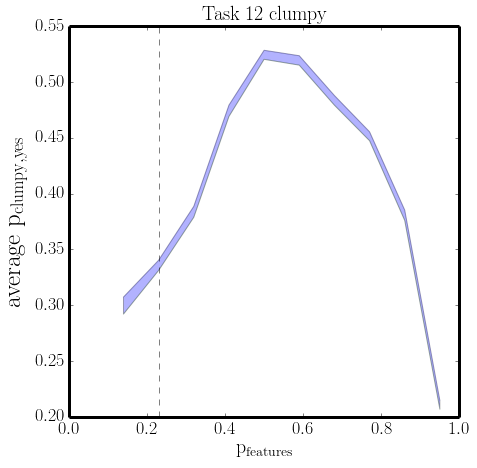

In [3]:
# plot how clumpy fraction is affected by previous question
p_features_cut = 0.23

plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(7,7))

plt.plot(p_prev_task_list,y1,alpha=.1)
plt.plot(p_prev_task_list,y2,alpha=.1)
plt.fill_between(p_prev_task_list,y1,y2,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{clumpy,yes}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{features}}$',fontsize=20)
plt.title(r'$\mathrm{Task~12~clumpy}$',fontsize=20)
plt.axvline(x=p_features_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)

## Below: Visually inspect galaxies for "clumpy candidates" - galaxies for which asking the clumpy question makes physical sense. These should be disks or irregulars, not ellipticals.

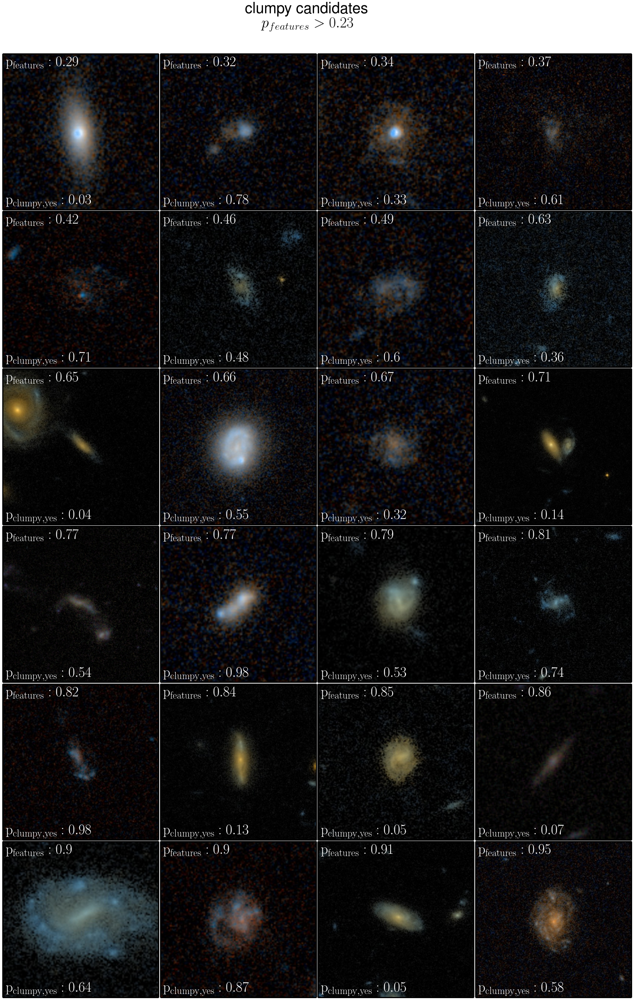

In [7]:
featured=(data[p_features]>p_features_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_features, column 15
random_gal_list.sort(key=itemgetter(15))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{features}: %s}$'%round(gal[p_features],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{clumpy,yes}: %s}$'%round(gal[p_clumpy_yes],2),fontsize=38,xy=(0.02,0.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'clumpy candidates\n$p_{features} > %s$'%p_features_cut, fontsize=40,ha='center')





## Below: The control sample; galaxies for which asking the clumpy question does *not* make sense. These should be smooth. 

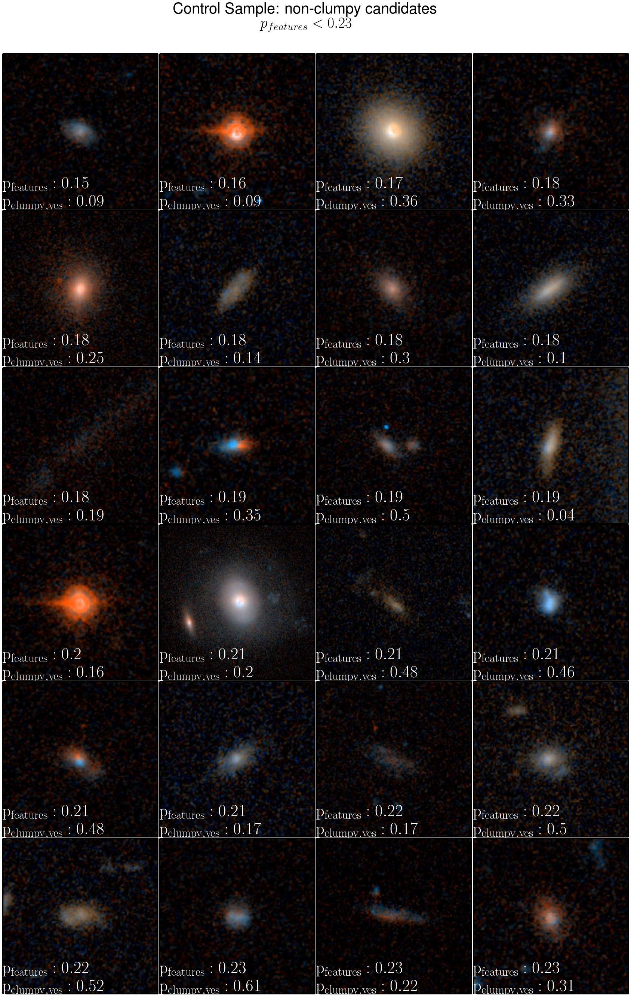

In [78]:
not_featured=(data[p_features]<p_features_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= not_featured & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_features, column 15
random_gal_list.sort(key=itemgetter(15))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{clumpy,yes}: %s}$'%(round(gal[p_features],2),round(gal[p_clumpy_yes],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non-clumpy candidates\n$p_{features} < %s$'%p_features_cut, fontsize=40,ha='center')





## Galaxies with $p_{features}$>0.23 and $N_{clumpy}$>20 are good candidates for evaluating the clumpy question. Update cuts table with this value:

In [79]:
cuts['p_features_cut']=p_features_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')